In [61]:
import os
import rasterio
import pyproj
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import glob
#import earthpy as et

In [8]:
os.chdir('F:\\GEOG458\\Geog458_final\\LC08_L1TP_041036_20181018_20181031_01_T1\\')

In [9]:
## background information about the Lidar image
with rasterio.open('LC08_L1TP_041036_20181018_20181031_01_T1_B1.TIF') as src:
    print(src.profile)

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': None, 'width': 7761, 'height': 7891, 'count': 1, 'crs': CRS.from_dict(init='epsg:32611'), 'transform': Affine(30.0, 0.0, 263385.0,
       0.0, -30.0, 3948615.0), 'tiled': False, 'interleave': 'band'}


In [71]:
## filter all files end with .tif and store them 
LS8_Bands = glob.glob("F:/GEOG458/Geog458_final/LC08_L1TP_041036_20181018_20181031_01_T1/*.tif")
LS8_Bands[0:2]

['F:/GEOG458/Geog458_final/LC08_L1TP_041036_20181018_20181031_01_T1\\LC08_L1TP_041036_20181018_20181031_01_T1_B1.TIF',
 'F:/GEOG458/Geog458_final/LC08_L1TP_041036_20181018_20181031_01_T1\\LC08_L1TP_041036_20181018_20181031_01_T1_B2.TIF']

Text(0, 0.5, 'Row #')

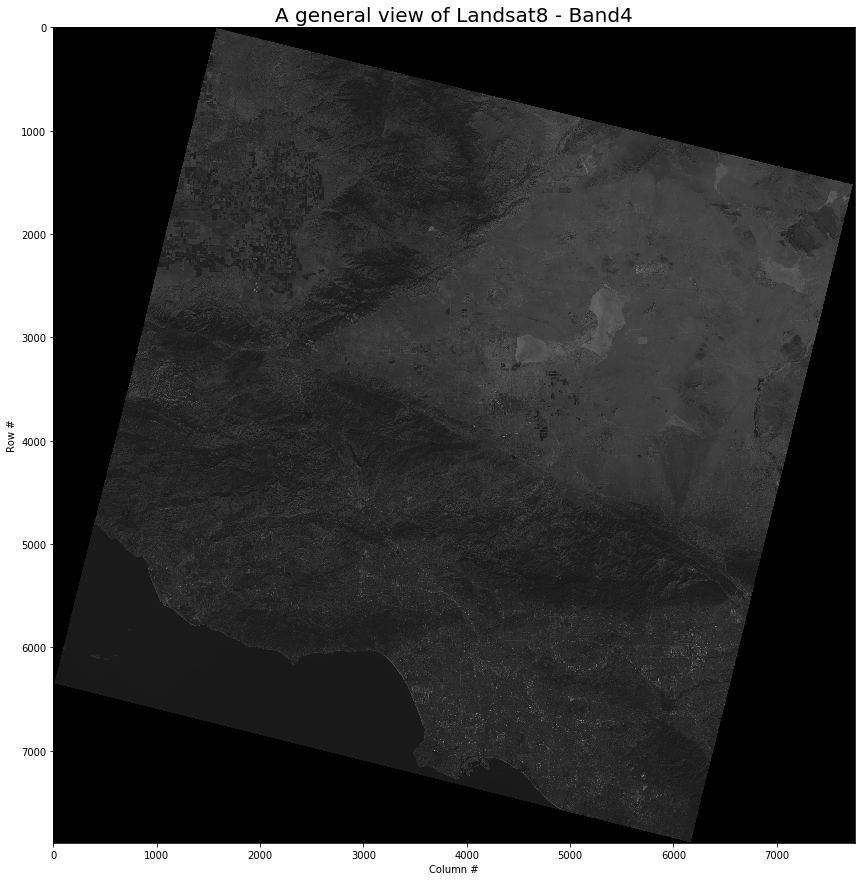

In [74]:
## Prefire Landsat 8 Band 4, full image
## Open Band 4 by using earthpy

import rasterio

with rasterio.open(LS8_Bands[3]) as src:
    LS8_Band4 = src.read(1)

plt.figure(figsize=(15,15))
plt.imshow(LS8_Band4, cmap = 'Greys_r')
plt.title('A general view of Landsat8 - Band4',fontsize=20)
plt.xlabel('Column #')
plt.ylabel('Row #')


Text(0, 0.5, 'Row #')

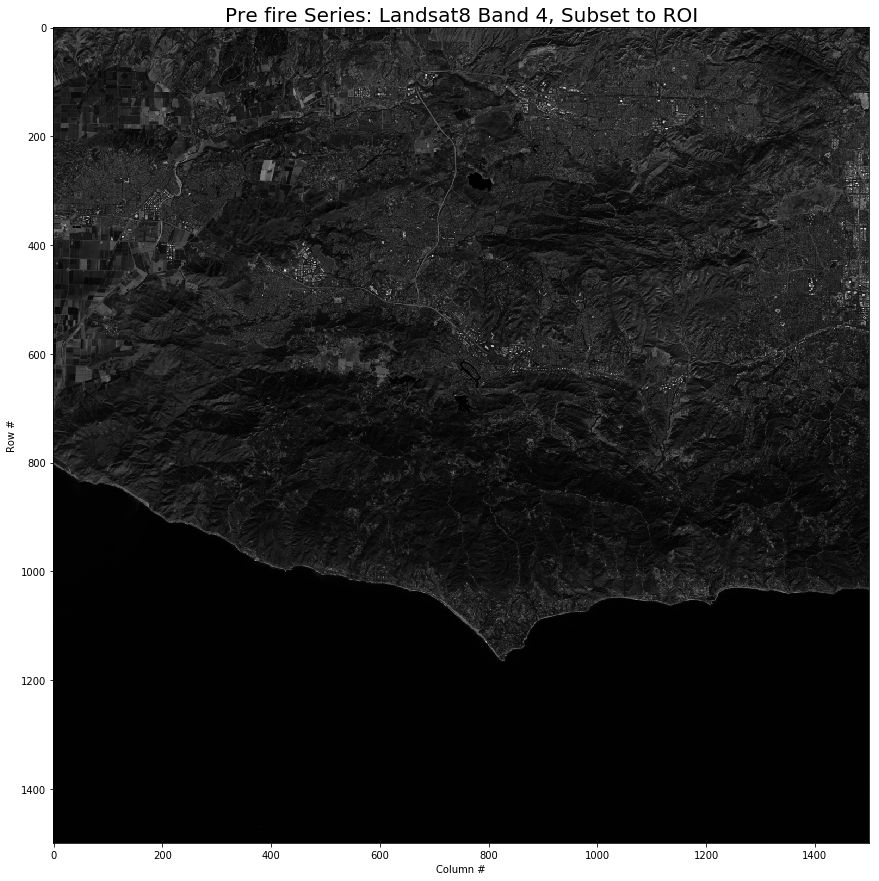

In [106]:
## Create a subset of the full resolution Landsat8 image 
##window = rasterio.windows.Window(1000, 4000, 2500, 2500)
window=rasterio.windows.Window(1500, 5000, 1500, 1500)
with rasterio.open(LS8_Bands[3]) as src:
    subset = src.read(1, window=window)

plt.figure(figsize=(15,15))
plt.imshow(subset, cmap = 'Greys_r')
plt.title('Pre fire Series: Landsat8 Band 4, Subset to ROI', fontsize=20)
plt.xlabel('Column #')
plt.ylabel('Row #')


In [18]:
## create a stack of Lidar Images

landsat_path = "C:/Users/LXB19/Documents/GEOG458/Group6_Final/prefire_output/LS08_PreFire.tif"
land_stack, land_meta = earthpy.spatial.stack(LS8_Bands, out_path= landsat_path)

(<Figure size 864x864 with 12 Axes>,
 array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002040328C128>,
       dtype=object))

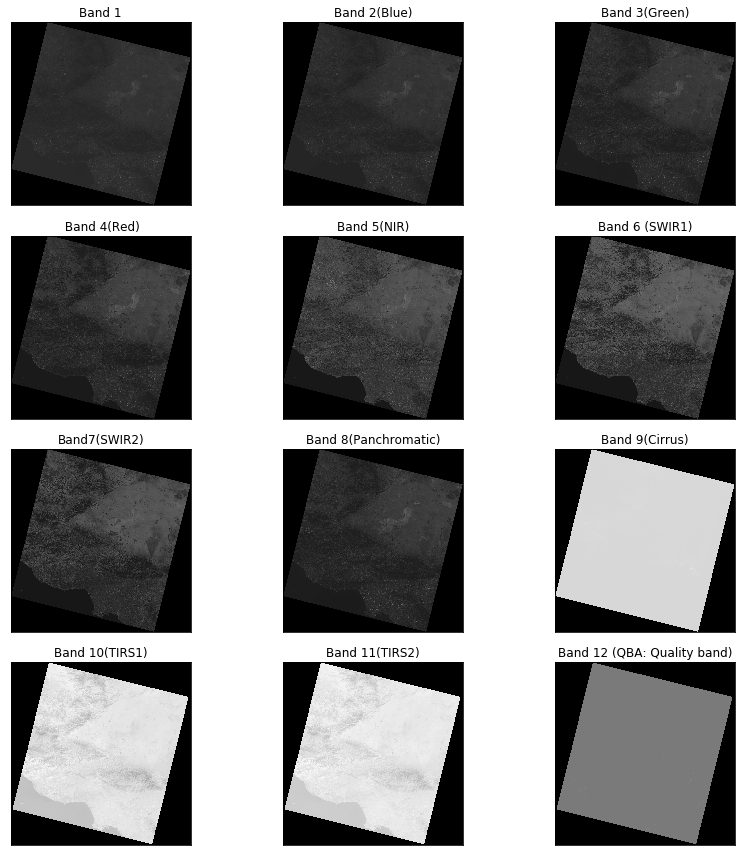

In [7]:
## Using earthpy to create a full stack of bands, Band 1 - 12. 

with rasterio.open(landsat_path) as src:
    landsat_prefire = src.read()

band_titles = ["Band 1", "Band 2(Blue)", "Band 3(Green)", " Band 4(Red)", "Band 5(NIR)",
               "Band 6 (SWIR1)", "Band7(SWIR2)", "Band 8(Panchromatic)", "Band 9(Cirrus)", 
               "Band 10(TIRS1)", "Band 11(TIRS2)", "Band 12 (QBA: Quality band)"]

ep.plot_bands(landsat_prefire, title = band_titles, cmap = "Greys_r")

In [14]:
# Function to normalize the grid values
def normalize(array):
    """Normalizes numpy arrays into scale 0.0 - 1.0"""
    array_min, array_max = array.min(), array.max()
    return ((array - array_min)/(array_max - array_min)) * 2


Text(0, 0.5, 'Row #')

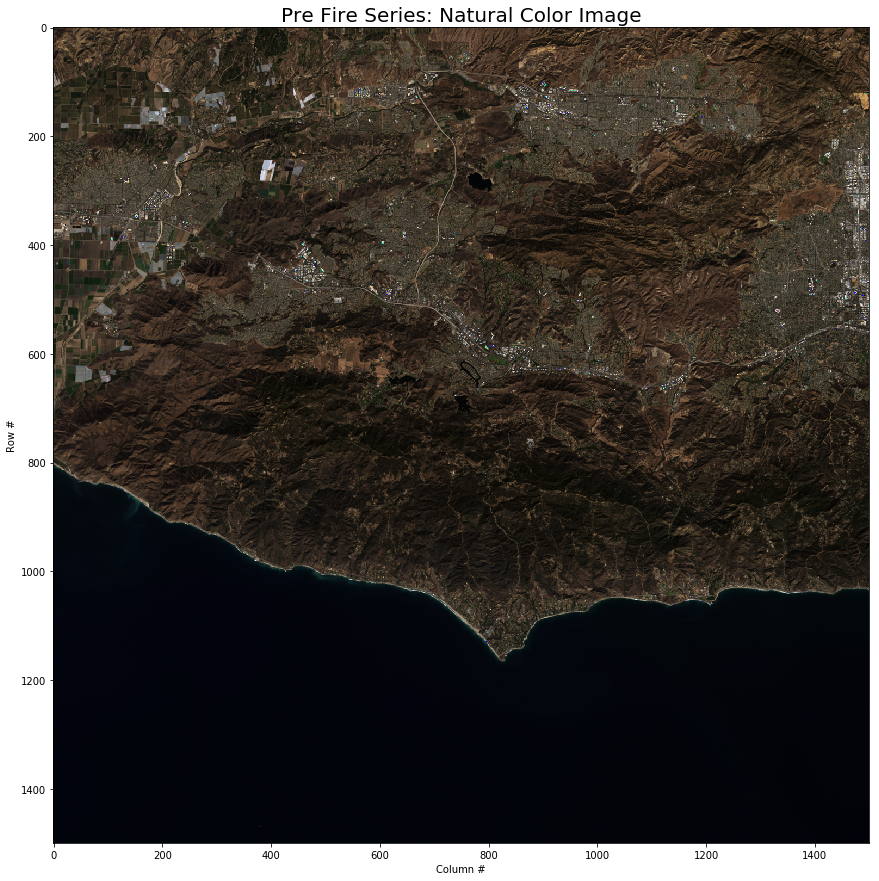

In [108]:
with rasterio.open(LS8_Bands[3]) as src:
    red_band = src.read(1, window=window)

with rasterio.open(LS8_Bands[2]) as src:
    green_band = src.read(1, window=window)

with rasterio.open(LS8_Bands[1]) as src:
    blue_band = src.read(1, window=window)

Nred = normalize(red_band)
Ngreen = normalize(green_band)
Nblue = normalize(blue_band)

rgb = np.dstack((Nred, Ngreen, Nblue))

plt.figure(figsize=(15,15))
plt.imshow((rgb * 255).astype(np.uint8))
plt.title('Pre Fire Series: Natural Color Image', fontsize=20)
plt.xlabel('Column #')
plt.ylabel('Row #')

Text(0, 0.5, 'Row #')

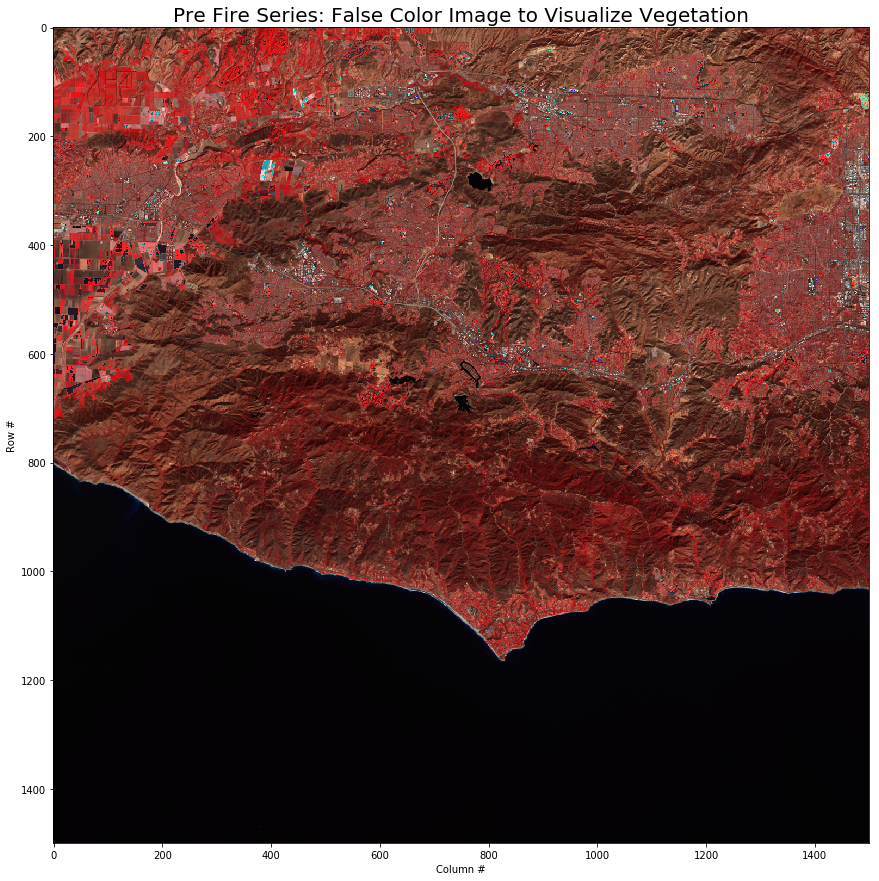

In [107]:
with rasterio.open(LS8_Bands[4]) as src:
    red_band = src.read(1, window=window)

with rasterio.open(LS8_Bands[3]) as src:
    green_band = src.read(1, window=window)

with rasterio.open(LS8_Bands[2]) as src:
    blue_band = src.read(1, window=window)

Nred = normalize(red_band)
Ngreen = normalize(green_band)
Nblue = normalize(blue_band)

FlaseColor = np.dstack((Nred, Ngreen, Nblue))

plt.figure(figsize=(15,15))
plt.imshow((FlaseColor * 255).astype(np.uint8))
plt.title('Pre Fire Series: False Color Image to Visualize Vegetation', fontsize=20)
plt.xlabel('Column #')
plt.ylabel('Row #')

Text(0, 0.5, 'Row #')

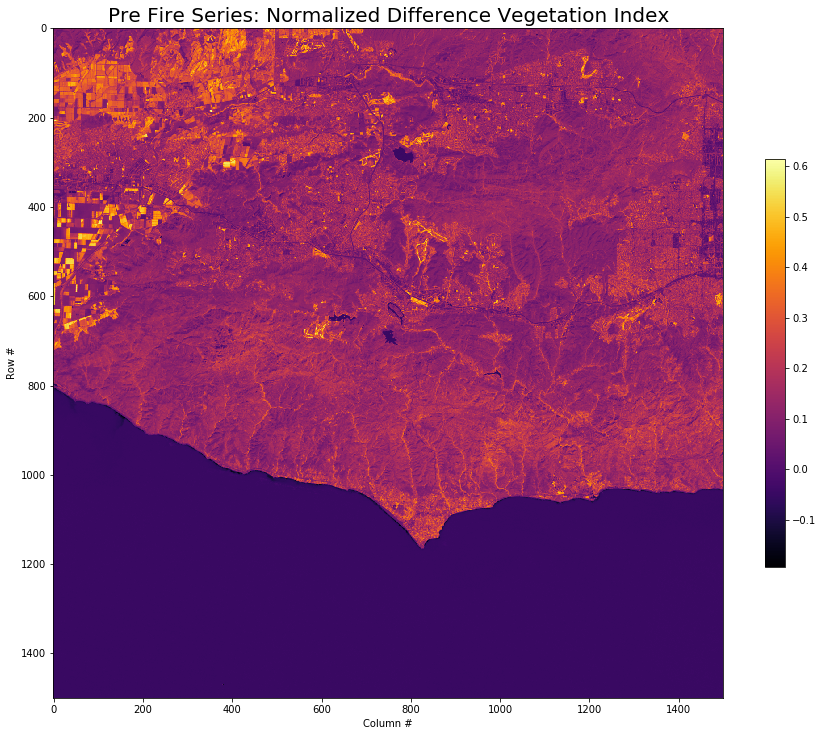

In [105]:
## calculate NDVI 

with rasterio.open(LS8_Bands[3]) as src :
    prefire_red = src.read(1, window=window)
    

with rasterio.open(LS8_Bands[4]) as src :
    prefire_NIR = src.read(1, window=window)

np.seterr(divide='ignore', invalid='ignore')

ndvi = (prefire_NIR.astype(float) - prefire_red.astype(float)) / (prefire_NIR.astype(float) + prefire_red.astype(float))

plt.figure(figsize=(15,15))
plt.imshow(ndvi,cmap='inferno')
plt.colorbar(shrink=0.5)
plt.title('Pre Fire Series: Normalized Difference Vegetation Index', fontsize=20)
plt.xlabel('Column #')
plt.ylabel('Row #')

Text(0, 0.5, 'Row #')

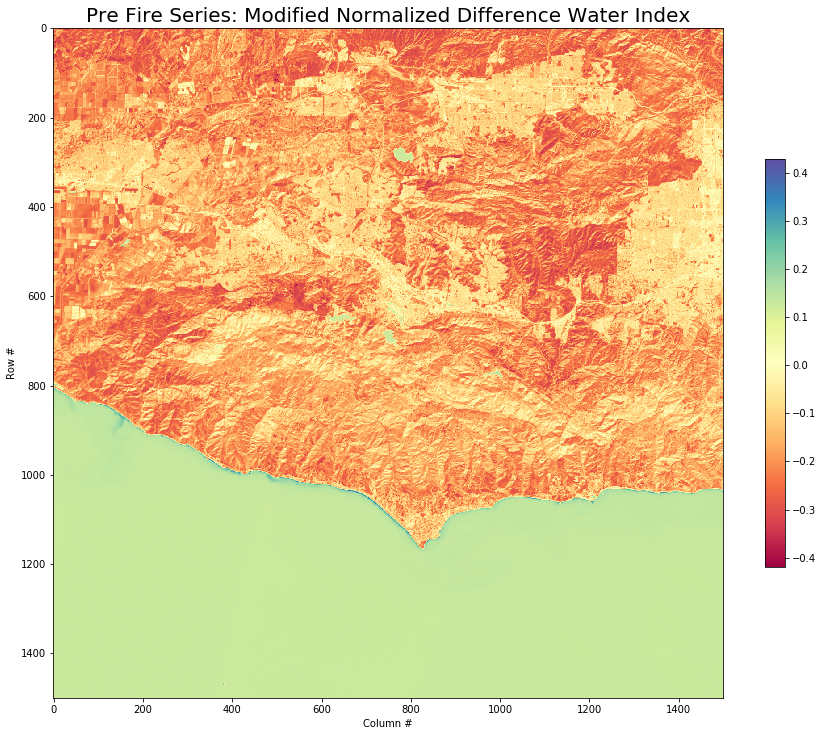

In [104]:
## mNDWI
with rasterio.open(LS8_Bands[2]) as src :
    green = src.read(1, window=window)
    
with rasterio.open(LS8_Bands[5]) as src :
    SWIR = src.read(1, window=window)

np.seterr(divide='ignore', invalid='ignore')

mNDWI = (green.astype(float) - SWIR.astype(float)) / (green.astype(float) + SWIR.astype(float))

plt.figure(figsize=(15,15))
plt.imshow(mNDWI,cmap='Spectral')
plt.colorbar(shrink=0.5)
plt.title('Pre Fire Series: Modified Normalized Difference Water Index',fontsize=20)
plt.xlabel('Column #')
plt.ylabel('Row #')


Text(0, 0.5, 'Row #')

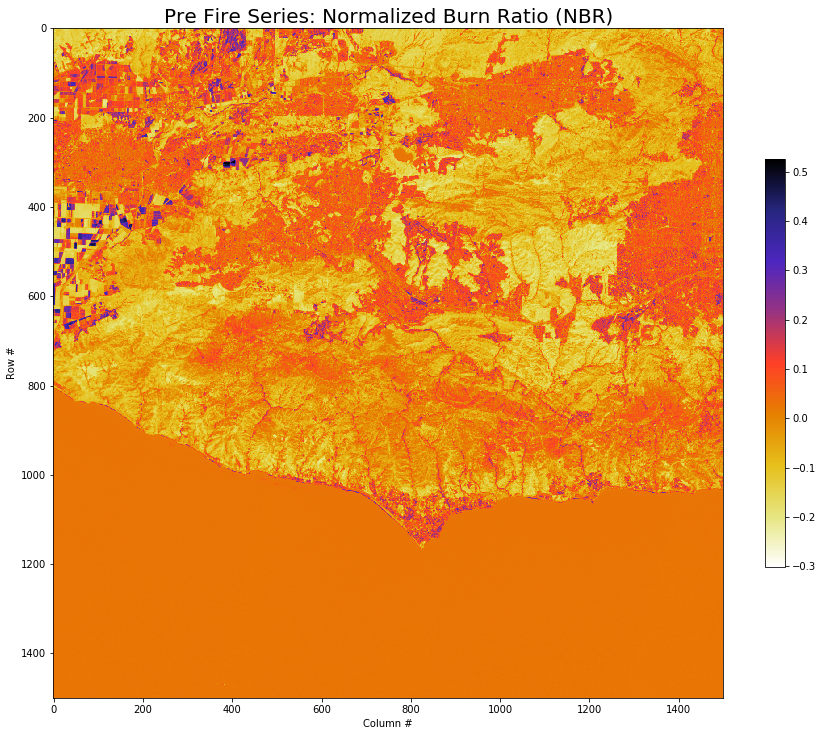

In [84]:
## Pre fire, Normalize Burn Ratio 

with rasterio.open(LS8_Bands[4]) as src :
    prefire_NIR = src.read(1, window=window)
    
with rasterio.open(LS8_Bands[5]) as src :
    prefire_SWIR = src.read(1, window=window)
    
np.seterr(divide='ignore', invalid='ignore')

pre_fire_NBR = (prefire_NIR.astype(float) - prefire_SWIR.astype(float)) / (prefire_NIR.astype(float) + prefire_SWIR.astype(float))

plt.figure(figsize=(15,15))
plt.imshow(pre_fire_NBR,cmap='CMRmap_r')
plt.colorbar(shrink=0.5)
plt.title('Pre Fire Series: Normalized Burn Ratio (NBR)', fontsize=20)
plt.xlabel('Column #')
plt.ylabel('Row #')

In [20]:
## user rasterio to open the images for post fire series

os.chdir('F:\\GEOG458\\Geog458_final\\LC08_L1TP_041036_20190122_20190205_01_T1\\')
date = '2019-01-22'

filepath2 = 'LC08_L1TP_041036_20190122_20190205_01_T1_B2.TIF'
with rasterio.open(filepath2) as src:
    blue = src.read(1, window=window)
    
filepath3 = 'LC08_L1TP_041036_20190122_20190205_01_T1_B3.TIF'
with rasterio.open(filepath3) as src:
    grn = src.read(1, window=window)

filepath4 = 'LC08_L1TP_041036_20190122_20190205_01_T1_B4.TIF'
with rasterio.open(filepath4) as src:
    red = src.read(1,window=window)

filepath5 = 'LC08_L1TP_041036_20190122_20190205_01_T1_B5.TIF'
with rasterio.open(filepath5) as src:
    nir = src.read(1, window=window)
    
filepath6 = 'LC08_L1TP_041036_20190122_20190205_01_T1_B6.TIF'
with rasterio.open(filepath6) as src:
    swir = src.read(1, window=window)

In [21]:
## Normalize the bands for natural color image
PostFire_Nred = normalize(red)
PostFire_Ngrn = normalize(grn)
PostFire_Nblue = normalize(blue)
PostFire_Nnir = normalize(nir)


Text(0, 0.5, 'Row #')

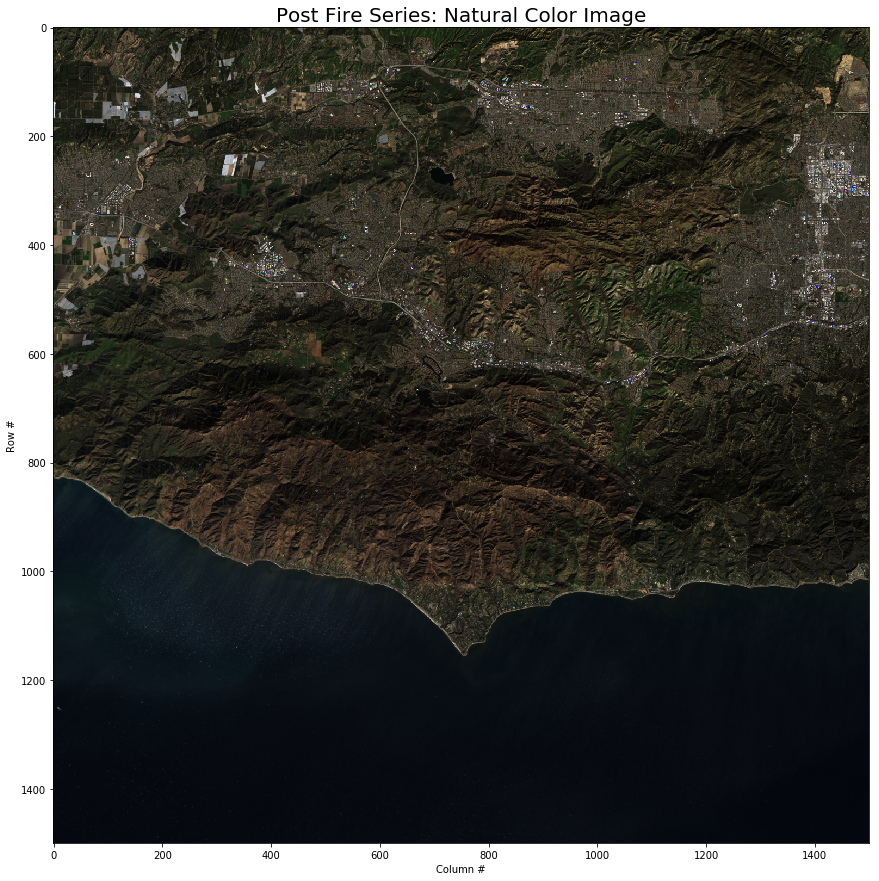

In [86]:
PostFire_rgb = np.dstack((PostFire_Nred,PostFire_Ngrn,PostFire_Nblue)) #stack rgb plot

plt.figure(figsize=(15,15))
plt.imshow((PostFire_rgb * 255).astype(np.uint8))
plt.title('Post Fire Series: Natural Color Image',fontsize=20)
plt.xlabel('Column #')
plt.ylabel('Row #')

Text(0, 0.5, 'Row #')

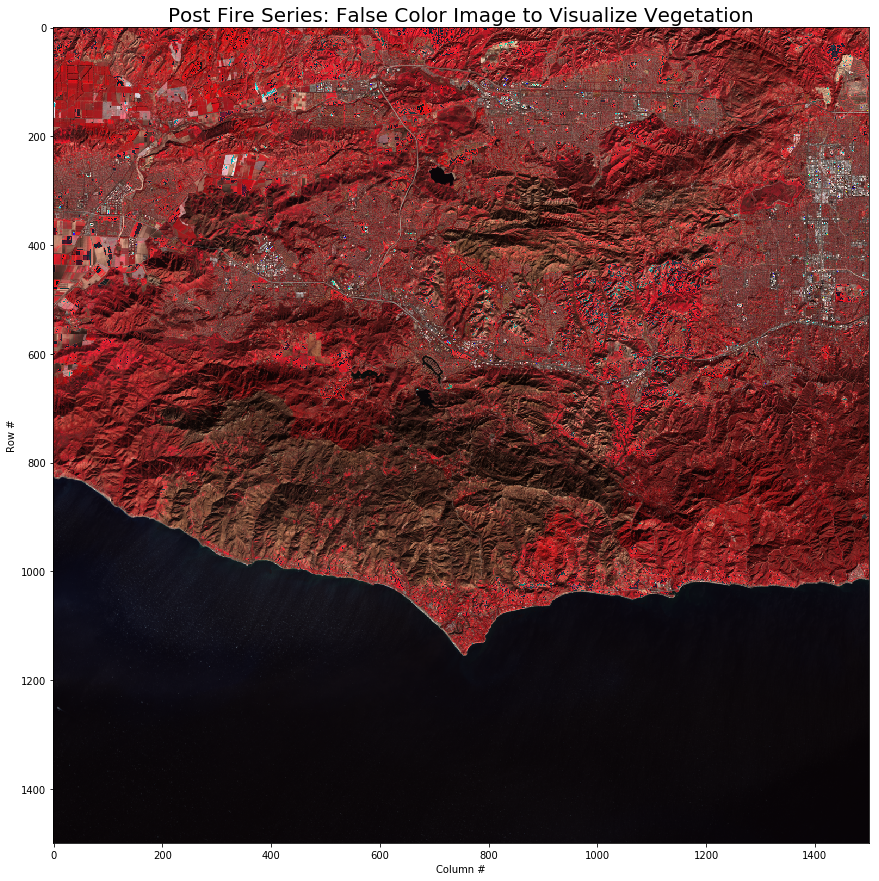

In [87]:
PostFire_FalseColor = np.dstack((PostFire_Nnir,PostFire_Nred,PostFire_Ngrn)) #stack false color plot

plt.figure(figsize=(15,15))
plt.imshow((PostFire_FalseColor * 255).astype(np.uint8))
plt.title('Post Fire Series: False Color Image to Visualize Vegetation', fontsize=20)
plt.xlabel('Column #')
plt.ylabel('Row #')

Text(0, 0.5, 'Row #')

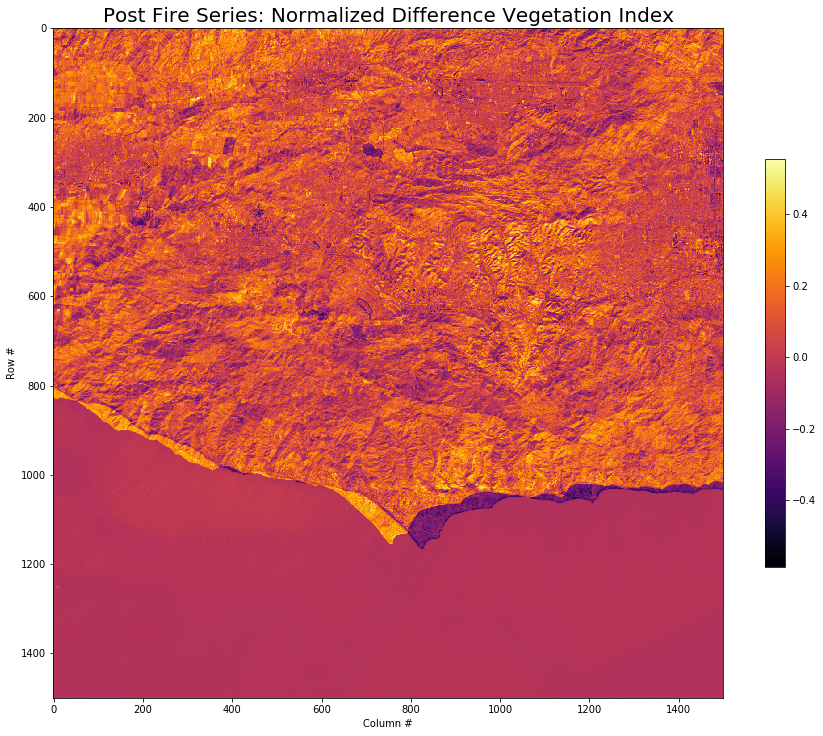

In [101]:
def calc(dat1,dat2):
    dat1 = dat1.astype(float)
    dat2 = dat2.astype(float)
    calc_outcome = (dat1 - dat2) / (dat1 + dat2) #ls8 calc equation
    return calc_outcome


ndvi = calc(nir,red) 
plt.figure(figsize=(15,15))
plt.imshow(ndvi, cmap='inferno')
plt.colorbar(shrink=0.5)
plt.title('Post Fire Series: Normalized Difference Vegetation Index', fontsize=20)
plt.xlabel('Column #')
plt.ylabel('Row #')
#plot calculated ndvi

Text(0, 0.5, 'Row #')

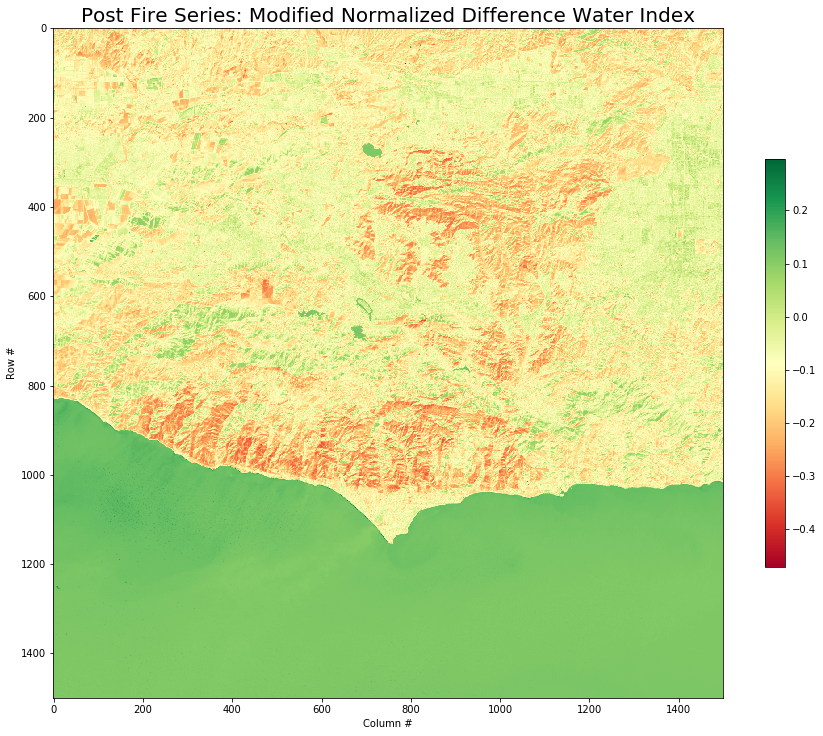

In [103]:
mNDWI = calc(grn,swir) #call calc function for mNDWI
plt.figure(figsize=(15,15))
plt.imshow(mNDWI, cmap='RdYlGn')
plt.colorbar(shrink=0.5)
plt.title('Post Fire Series: Modified Normalized Difference Water Index', fontsize = 20)
plt.xlabel('Column #')
plt.ylabel('Row #')
#plot calc mNDWI

Text(0, 0.5, 'Row #')

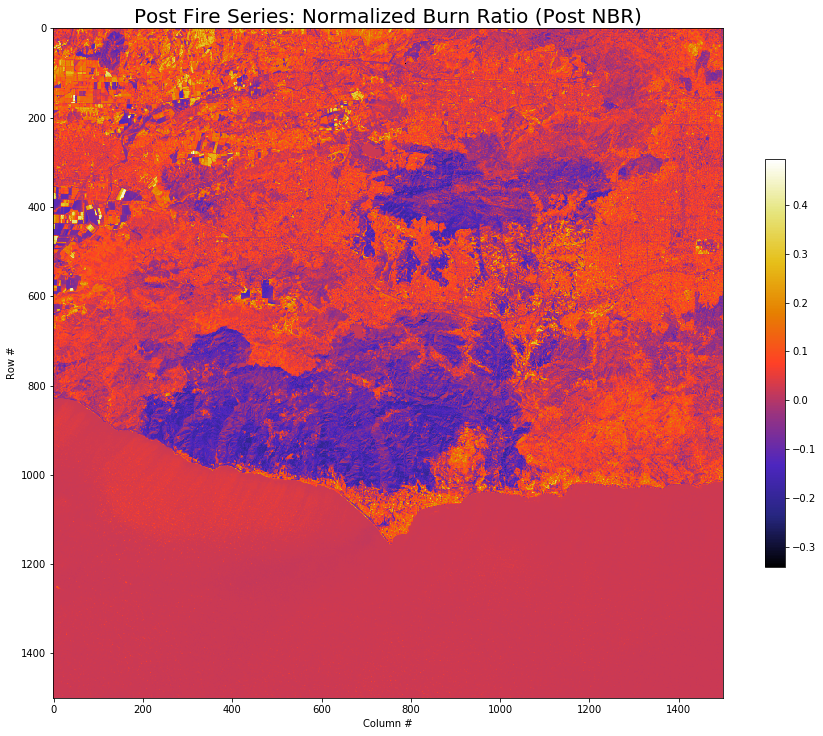

In [96]:
## Post fire NBR

with rasterio.open(filepath5) as src :
    nir = src.read(1, window=window)
    
with rasterio.open(filepath6) as src :
    swir = src.read(1, window=window)
    
np.seterr(divide='ignore', invalid='ignore')

post_fire_NBR = (nir.astype(float) - swir.astype(float)) / (niv.astype(float) + swir.astype(float))

plt.figure(figsize=(15,15))
plt.imshow(post_fire_NBR,cmap='CMRmap')
plt.colorbar(shrink=0.5)
plt.title('Post Fire Series: Normalized Burn Ratio (Post NBR)', fontsize=20)
plt.xlabel('Column #')
plt.ylabel('Row #')

Text(0, 0.5, 'Row #')

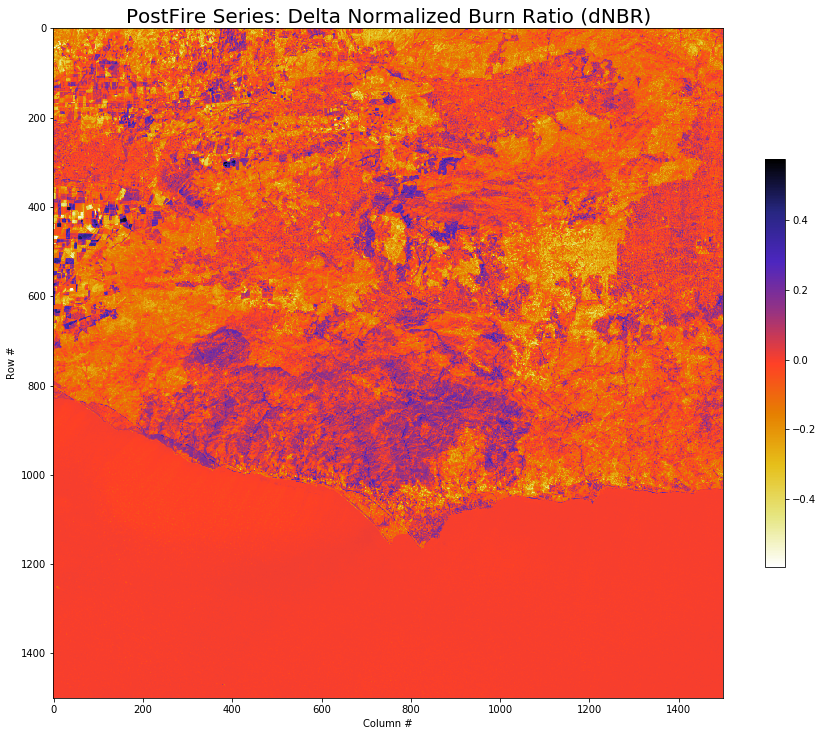

In [98]:
## Delta NBR 
delta_NBR = (pre_fire_NBR - post_fire_NBR)

plt.figure(figsize=(15,15))
plt.imshow(delta_NBR,cmap='CMRmap_r')
plt.colorbar(shrink=0.5)
plt.title('PostFire Series: Delta Normalized Burn Ratio (dNBR)', fontsize = 20)
plt.xlabel('Column #')
plt.ylabel('Row #')